In [1]:
ls

kaggle.json  sample_data/


In [3]:
!mkdir -p /root/.kaggle
!mv kaggle.json /root/.kaggle

In [4]:
import kaggle

In [5]:
!kaggle competitions download -c dogs-vs-cats

  0% 0.00/86.8k [00:00<?, ?B/s]
100% 86.8k/86.8k [00:00<00:00, 36.3MB/s]
 98% 265M/271M [00:01<00:00, 223MB/s]
100% 271M/271M [00:01<00:00, 233MB/s]
100% 543M/543M [00:02<00:00, 248MB/s]



In [6]:
!unzip -q train.zip

In [8]:
# earlier - Loaded the data in RAM and send images in batches 
# Image Data Generator -  The data is send to DL model in batches rather than whole. 
# Read the image only when required (by DL Model)

# Image data Generator requires you to set data in a particular format 
# train_folder
# -   cat_folder
# -   -  cat_image1.jpg
# -   -  cat_image2.jpg
# -   dog_folder
# -   -  dog_image1.jpg
# -   -  dog_image2.jpg
# -   elephant_folder
# -   -  elephant_image1.jpg
# -   -  elephant_image2.jpg

In [9]:
# Current structure of data is like this - 
# - train
# -     - cat.jpg
# -     - dog.jpg

In [10]:
! mkdir train_folder
! mkdir train_folder/cat
! mkdir train_folder/do

In [11]:
import os
import shutil
from tqdm import notebook
for img_name in notebook.tqdm(os.listdir("train")):
  if "cat" in img_name.lower():
    shutil.copy("train/" + img_name, "train_folder/cat/" + img_name)
  else:
    shutil.copy("train/" + img_name, "train_folder/dog/" + img_name)

In [12]:
%tensorflow_version 2.x
import tensorflow as tf

In [13]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [17]:
idg=ImageDataGenerator(validation_split=0.2,rescale=1/255.0)
train_generator=idg.flow_from_directory('train_folder',batch_size=32,subset="training",target_size=(150,150))#nothing is loaded in the ram
test_generator=idg.flow_from_directory('train_folder',batch_size=32,subset="validation",target_size=(150,150) )    

Found 20000 images belonging to 2 classes.
Found 5000 images belonging to 2 classes.


In [19]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten,Dense,Conv2D,MaxPooling2D
from tensorflow.keras.activations import relu,softmax
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.losses import categorical_crossentropy 


In [23]:
#(I - F + S)/S 
(150 - 3 + 1)/1
(74 - 3 +1)/1

72.0

In [ ]:
# (I - F)/S + S/S, #(I-F+2P+S)/S

In [21]:
model=Sequential()
model.add(Conv2D(32,kernel_size=(3,3),strides=(1,1),input_shape=(150,150,3),activation=relu))
model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
model.add(Conv2D(64,kernel_size=(3,3),strides=(1,1),activation=relu))
model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
model.add(Flatten())
model.add(Dense(units=64,activation=relu))

model.add(Dense(units=2,activation=softmax))
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_2 (Conv2D)            (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 72, 72, 64)        18496     
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 36, 36, 64)        0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 82944)             0         
_________________________________________________________________
dense_2 (Dense)              (None, 64)                5308480   
_________________________________________________________________
dense_3 (Dense)              (None, 2)                

In [25]:
model.compile(optimizer=SGD(),loss=categorical_crossentropy,metrics=['acc'])

In [26]:
#fit
model.fit_generator(train_generator,epochs=10,validation_data=test_generator)

Instructions for updating:
Please use Model.fit, which supports generators.
Epoch 1/10
625/625 [==============================] - 73s 117ms/step - loss: 0.6793 - acc: 0.5609 - val_loss: 0.6558 - val_acc: 0.6030
Epoch 2/10
625/625 [==============================] - 73s 117ms/step - loss: 0.6456 - acc: 0.6195 - val_loss: 0.6208 - val_acc: 0.6418
Epoch 3/10
625/625 [==============================] - 72s 116ms/step - loss: 0.6132 - acc: 0.6579 - val_loss: 0.5877 - val_acc: 0.6826
Epoch 4/10
625/625 [==============================] - 71s 114ms/step - loss: 0.5766 - acc: 0.6952 - val_loss: 0.5613 - val_acc: 0.7136
Epoch 5/10
625/625 [==============================] - 71s 114ms/step - loss: 0.5437 - acc: 0.7224 - val_loss: 0.5315 - val_acc: 0.7390
Epoch 6/10
625/625 [==============================] - 71s 114ms/step - loss: 0.5093 - acc: 0.7471 - val_loss: 0.5156 - val_acc: 0.7514
Epoch 7/10
625/625 [==============================] - 71s 113ms/step - loss: 0.4775 - acc: 0.7733 - val_loss: 0.50

In [ ]:
del model

In [30]:
!wget https://image.cnbcfm.com/api/v1/image/105992231-1561667465295gettyimages-521697453.jpeg?v=1561667497&w=1600&h=900

--2020-08-15 16:18:20--  https://image.cnbcfm.com/api/v1/image/105992231-1561667465295gettyimages-521697453.jpeg?v=1561667497
Resolving image.cnbcfm.com (image.cnbcfm.com)... 23.62.73.68
Connecting to image.cnbcfm.com (image.cnbcfm.com)|23.62.73.68|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 272588 (266K) [image/jpeg]
Saving to: ‘105992231-1561667465295gettyimages-521697453.jpeg?v=1561667497’

105992231-156166746 100%[===================>] 266.20K  --.-KB/s    in 0.05s   

2020-08-15 16:18:20 (5.19 MB/s) - ‘105992231-1561667465295gettyimages-521697453.jpeg?v=1561667497’ saved [272588/272588]



In [34]:
import cv2
import numpy as np 
image=cv2.imread('dog.jpeg')
image=cv2.resize(image,(150,150))
image=image/255.0
image=np.expand_dims(image,axis=0)

In [35]:
image.shape

(1, 150, 150, 3)

In [44]:
train_generator.class_indices

{'cat': 0, 'dog': 1}

In [41]:
map_dict = {v:k for k,v in train_generator.class_indices.items()}
map_dict

{0: 'cat', 1: 'dog'}

In [43]:
map_dict.get(model.predict_classes(image)[0])

'dog'

In [45]:
! wget https://www.purelypetsinsurance.co.uk/media/1138/dog-and-kitten-meeting.jpg

--2020-08-15 16:32:07--  https://www.purelypetsinsurance.co.uk/media/1138/dog-and-kitten-meeting.jpg
Resolving www.purelypetsinsurance.co.uk (www.purelypetsinsurance.co.uk)... 91.237.210.20
Connecting to www.purelypetsinsurance.co.uk (www.purelypetsinsurance.co.uk)|91.237.210.20|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3057317 (2.9M) [image/jpeg]
Saving to: ‘dog-and-kitten-meeting.jpg’

dog-and-kitten-meet 100%[===================>]   2.92M   842KB/s    in 3.5s    

2020-08-15 16:32:12 (842 KB/s) - ‘dog-and-kitten-meeting.jpg’ saved [3057317/3057317]



In [47]:
image=cv2.imread('dog-and-kitten-meeting.jpg')
image=cv2.resize(image,(150,150))
image=image/255.0
image=np.expand_dims(image,axis=0)
image.shape

(1, 150, 150, 3)

In [48]:
model.predict_proba(image)

array([[0.09944196, 0.90055805]], dtype=float32)

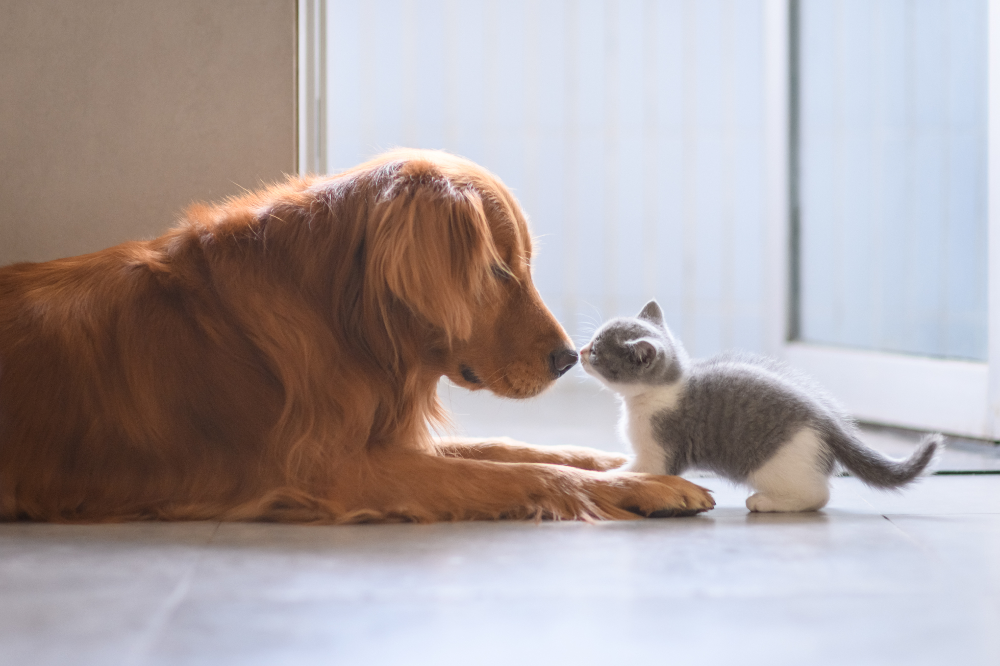

In [49]:
from PIL import Image
Image.open("dog-and-kitten-meeting.jpg")